## Main Reference
1. [PyTorch-GAN | Github/eriklindernoren | Collection of PyTorch implementations of GAN](https://github.com/sw-song/PyTorch-GAN)
2. [CycleGAN | Github/junyanz | Torch implementation for learning an image-to-image translation without input-output pairs](https://github.com/junyanz/CycleGAN)

## Index
```
Step 1. Import Libraries
Step 2. Initial Setting
Step 3. Define Generator
Step 4. Define Discriminator
Step 5. Define Loss Function
Step 6. Initialize Generator and Discriminator
Step 7. GPU Setting
Step 8. Weight Setting
Step 9. Configure Optimizer
Step 10. Learning Rate Scheduler Setting
Step 11. Image Transformation Setting
Step 12. DataLoader Setting
Step 13. Define function to get sample images
Step 14. Training
```
---

### Step 1. Import Libraries

In [1]:
import numpy as np

import torchvision.transforms as transforms
from torchvision.utils import make_grid

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Step 2. Initial Setting

In [3]:
!cat /proc/cpuinfo | grep processor

processor	: 0
processor	: 1
processor	: 2
processor	: 3
processor	: 4
processor	: 5
processor	: 6
processor	: 7
processor	: 8
processor	: 9
processor	: 10
processor	: 11


In [4]:
n_cpu = 2 # number of cpu threads to use during batch generation

In [5]:
# data (path)
path = "/content/drive/MyDrive/data"
dataset_name = 'dataset'
root = '../input/'+dataset_name

# data (img)
#img_height = 256
img_height = 200
#img_width = 256
img_width = 240
channels = 3

# training
epoch = 0 # epoch to start training from
n_epochs = 40 #20 # number of epochs of training
batch_size = 1 # size of the batches
lr = 0.0002 # adam : learning rate
b1 = 0.5 # adam : decay of first order momentum of gradient
b2 = 0.999 # adam : decay of first order momentum of gradient
decay_epoch = 3 # suggested default : 100 (suggested 'n_epochs' is 200)
                 # epoch from which to start lr decay


### Step 3. Define Generator

In [6]:
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()
        
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1), # Pads the input tensor using the reflection of the input boundary
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features), 
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features)
        )

    def forward(self, x):
        return x + self.block(x)


class GeneratorResNet(nn.Module):
    def __init__(self, input_shape, num_residual_block):
        super(GeneratorResNet, self).__init__()
        
        channels = input_shape[0]
        
        # Initial Convolution Block
        out_features = 64
        model = [
            nn.ReflectionPad2d(channels),
            nn.Conv2d(channels, out_features, 7),
            nn.InstanceNorm2d(out_features),
            nn.ReLU(inplace=True)
        ]
        in_features = out_features
        
        # Downsampling
        for _ in range(2):
            out_features *= 2
            model += [
                nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
        
        # Residual blocks
        for _ in range(num_residual_block):
            model += [ResidualBlock(out_features)]
            
        # Upsampling
        for _ in range(2):
            out_features //= 2
            model += [
                nn.Upsample(scale_factor=2), # --> width*2, heigh*2
                nn.Conv2d(in_features, out_features, 3, stride=1, padding=1),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            
        # Output Layer
        model += [nn.ReflectionPad2d(channels),
                  nn.Conv2d(out_features, channels, 7),
                  nn.Tanh()
                 ]
        
        # Unpacking
        self.model = nn.Sequential(*model) 
        
    def forward(self, x):
        return self.model(x)

### Step 4. Define Discriminator

In [7]:
class Discriminator(nn.Module):
    def __init__(self, input_shape):
        super(Discriminator, self).__init__()
        
        channels, height, width = input_shape
        
        # Calculate output shape of image discriminator (PatchGAN)
        self.output_shape = (1, height//2**4, width//2**4)
        
        def discriminator_block(in_filters, out_filters, normalize=True):
            """Returns downsampling layers of each discriminator block"""
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers
        
        self.model = nn.Sequential(
            *discriminator_block(channels, 64, normalize=False),
            *discriminator_block(64, 128),
            *discriminator_block(128,256),
            *discriminator_block(256,512),
            nn.ZeroPad2d((1,0,1,0)),
            nn.Conv2d(512, 1, 4, padding=1)
        )
        
    def forward(self, img):
        return self.model(img)

### Step 5. Define Loss

In [8]:
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()
criterion_identity = torch.nn.L1Loss()

### Step 6. Initialize Generator and Discriminator

In [9]:
input_shape = (channels, img_height, img_width) # (3,256,256)
n_residual_blocks = 9 # suggested default, number of residual blocks in generator

G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)

### Step 7. GPU Setting

In [10]:
cuda = torch.cuda.is_available()

if cuda:
    print("CUDA is available")
    G_AB = G_AB.cuda()
    G_BA = G_BA.cuda()
    D_A = D_A.cuda()
    D_B = D_B.cuda()
    
    criterion_GAN.cuda()
    criterion_cycle.cuda()
    criterion_identity.cuda()

CUDA is available


### Step 8. Weight Setting

In [11]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02) # reset Conv2d's weight(tensor) with Gaussian Distribution
        if hasattr(m, 'bias') and m.bias is not None:
            torch.nn.init.constant_(m.bias.data, 0.0) # reset Conv2d's bias(tensor) with Constant(0)
        elif classname.find('BatchNorm2d') != -1:
            torch.nn.init.normal_(m.weight.data, 1.0, 0.02) # reset BatchNorm2d's weight(tensor) with Gaussian Distribution
            torch.nn.init.constant_(m.bias.data, 0.0) # reset BatchNorm2d's bias(tensor) with Constant(0)

In [12]:
G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): ZeroPad2d((1, 0, 1, 0))
    (12): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  )
)

### Step 9. Configure Optimizers

In [13]:
import itertools
# lr = 0.0002
# b1 = 0.5
# b2 = 0.999

optimizer_G = torch.optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr, betas=(b1,b2)
)

optimizer_D_A = torch.optim.Adam(
    D_A.parameters(), lr=lr, betas=(b1,b2)
)
optimizer_D_B = torch.optim.Adam(
    D_B.parameters(), lr=lr, betas=(b1,b2)
)

### Step 10. Learning Rate Scheduler Setting

In [14]:
class LambdaLR:
    def __init__(self, n_epochs, offset, decay_start_epoch):
        assert (n_epochs - decay_start_epoch) > 0, "Decay must start before the training session ends!"
        self.n_epochs = n_epochs
        self.offset = offset
        self.decay_start_epoch = decay_start_epoch
        
    def step(self, epoch):
        return 1.0 - max(0, epoch+self.offset - self.decay_start_epoch)/(self.n_epochs - self.decay_start_epoch)

In [15]:
# n_epochs = 10
# epoch = 0
# decay_epoch = 5


lr_scheduler_G = torch.optim.lr_scheduler.LambdaLR(
    optimizer_G,
    lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)

lr_scheduler_D_A = torch.optim.lr_scheduler.LambdaLR(
    optimizer_D_A,
    lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)
lr_scheduler_D_B = torch.optim.lr_scheduler.LambdaLR(
    optimizer_D_B,
    lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)

### Step 11. Image Transformation Setting

In [16]:
from PIL import Image
import torchvision.transforms as transforms

transforms_ = [
    transforms.Resize(int(img_height*1.12), Image.BICUBIC),
    transforms.RandomCrop((img_height, img_width)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
]

### Step 12. DataLoader Setting

In [17]:
def to_rgb(image):
    rgb_image = Image.new("RGB", image.size)
    rgb_image.paste(image)
    return rgb_image

In [18]:
import os
import glob

In [19]:
root = "/content/drive/MyDrive/data/dataset/"
print(root+'train/0')

/content/drive/MyDrive/data/dataset/train/0


In [ ]:
len(glob.glob(os.path.join(root+'train/0')+'/*.*'))

1698

In [ ]:
len(glob.glob(os.path.join(root+'train/1')+'/*.*'))

1691

In [20]:
from torch.utils.data import Dataset

class ImageDataset(Dataset):
    def __init__(self, root, transforms_=None, unaligned=False, mode='train'):
        self.transform = transforms.Compose(transforms_)
        self.unaligned = unaligned
        self.mode = mode
        if self.mode == 'train':
            self.files_A = sorted(glob.glob(os.path.join(root+'train/1')+'/*.*'))#[:250])
            self.files_B = sorted(glob.glob(os.path.join(root+'train/0')+'/*.*'))#[:250])#[:250])
        elif self.mode == 'test':
            self.files_A = sorted(glob.glob(os.path.join(root+'test/1')+'/*.*'))#[:250])#[250:])
            self.files_B = sorted(glob.glob(os.path.join(root+'test/0')+'/*.*'))#[:250])#[250:301])

    def  __getitem__(self, index):
        image_A = Image.open(self.files_A[index % len(self.files_A)])
        
        if self.unaligned:
            image_B = Image.open(self.files_B[np.random.randint(0, len(self.files_B)-1)])
        else:
            image_B = Image.open(self.files_B[index % len(self.files_B)])
        if image_A.mode != 'RGB':
            image_A = to_rgb(image_A)
        if image_B.mode != 'RGB':
            image_B = to_rgb(image_B)
            
        item_A = self.transform(image_A)
        item_B = self.transform(image_B)
        return {'A':item_A, 'B':item_B}
    
    def __len__(self):
        return max(len(self.files_A), len(self.files_B))
            

In [21]:
dataloader = DataLoader(
    ImageDataset(root, transforms_=transforms_, unaligned=True),
    #batch_size=1, # 1
    batch_size=1,
    shuffle=True,
    num_workers=n_cpu # 3
)

val_dataloader = DataLoader(
    ImageDataset(root, transforms_=transforms_, unaligned=True, mode='test'),
    batch_size=5,#5,
    shuffle=True,
    num_workers=n_cpu
)

### Step 13. Define function to get sample images

In [22]:
import matplotlib.pyplot as plt

In [23]:
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

In [24]:
def sample_images():
    """show a generated sample from the test set"""
    imgs = next(iter(val_dataloader))
    G_AB.eval()
    G_BA.eval()
    real_A = imgs['A'].type(Tensor) # A : monet
    fake_B = G_AB(real_A).detach()
    real_B = imgs['B'].type(Tensor) # B : photo
    fake_A = G_BA(real_B).detach()
    # Arange images along x-axis
    real_A = make_grid(real_A, nrow=5, normalize=True)
    fake_B = make_grid(fake_B, nrow=5, normalize=True)
    real_B = make_grid(real_B, nrow=5, normalize=True)
    fake_A = make_grid(fake_A, nrow=5, normalize=True)
    # Arange images along y-axis    
    image_grid = torch.cat((real_A, fake_B, real_B, fake_A), 1)
    plt.imshow(image_grid.cpu().permute(1,2,0))
    plt.title('Real A vs Fake B | Real B vs Fake A')
    plt.axis('off')
    plt.show();

In [25]:
from torchsummary import summary
summary(G_AB, (3, 240, 200))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1          [-1, 3, 246, 206]               0
            Conv2d-2         [-1, 64, 240, 200]           9,472
    InstanceNorm2d-3         [-1, 64, 240, 200]               0
              ReLU-4         [-1, 64, 240, 200]               0
            Conv2d-5        [-1, 128, 120, 100]          73,856
    InstanceNorm2d-6        [-1, 128, 120, 100]               0
              ReLU-7        [-1, 128, 120, 100]               0
            Conv2d-8          [-1, 256, 60, 50]         295,168
    InstanceNorm2d-9          [-1, 256, 60, 50]               0
             ReLU-10          [-1, 256, 60, 50]               0
  ReflectionPad2d-11          [-1, 256, 62, 52]               0
           Conv2d-12          [-1, 256, 60, 50]         590,080
   InstanceNorm2d-13          [-1, 256, 60, 50]               0
             ReLU-14          [-1, 256,

In [26]:
summary(G_BA, (3, 240, 200))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1          [-1, 3, 246, 206]               0
            Conv2d-2         [-1, 64, 240, 200]           9,472
    InstanceNorm2d-3         [-1, 64, 240, 200]               0
              ReLU-4         [-1, 64, 240, 200]               0
            Conv2d-5        [-1, 128, 120, 100]          73,856
    InstanceNorm2d-6        [-1, 128, 120, 100]               0
              ReLU-7        [-1, 128, 120, 100]               0
            Conv2d-8          [-1, 256, 60, 50]         295,168
    InstanceNorm2d-9          [-1, 256, 60, 50]               0
             ReLU-10          [-1, 256, 60, 50]               0
  ReflectionPad2d-11          [-1, 256, 62, 52]               0
           Conv2d-12          [-1, 256, 60, 50]         590,080
   InstanceNorm2d-13          [-1, 256, 60, 50]               0
             ReLU-14          [-1, 256,

In [27]:
summary(D_A, (3, 240, 200))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 120, 100]           3,136
         LeakyReLU-2         [-1, 64, 120, 100]               0
            Conv2d-3          [-1, 128, 60, 50]         131,200
    InstanceNorm2d-4          [-1, 128, 60, 50]               0
         LeakyReLU-5          [-1, 128, 60, 50]               0
            Conv2d-6          [-1, 256, 30, 25]         524,544
    InstanceNorm2d-7          [-1, 256, 30, 25]               0
         LeakyReLU-8          [-1, 256, 30, 25]               0
            Conv2d-9          [-1, 512, 15, 12]       2,097,664
   InstanceNorm2d-10          [-1, 512, 15, 12]               0
        LeakyReLU-11          [-1, 512, 15, 12]               0
        ZeroPad2d-12          [-1, 512, 16, 13]               0
           Conv2d-13            [-1, 1, 15, 12]           8,193
Total params: 2,764,737
Trainable param

In [28]:
summary(D_B, (3, 240, 200))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 120, 100]           3,136
         LeakyReLU-2         [-1, 64, 120, 100]               0
            Conv2d-3          [-1, 128, 60, 50]         131,200
    InstanceNorm2d-4          [-1, 128, 60, 50]               0
         LeakyReLU-5          [-1, 128, 60, 50]               0
            Conv2d-6          [-1, 256, 30, 25]         524,544
    InstanceNorm2d-7          [-1, 256, 30, 25]               0
         LeakyReLU-8          [-1, 256, 30, 25]               0
            Conv2d-9          [-1, 512, 15, 12]       2,097,664
   InstanceNorm2d-10          [-1, 512, 15, 12]               0
        LeakyReLU-11          [-1, 512, 15, 12]               0
        ZeroPad2d-12          [-1, 512, 16, 13]               0
           Conv2d-13            [-1, 1, 15, 12]           8,193
Total params: 2,764,737
Trainable param

### Step 14. Training

In [ ]:
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import warnings

In [ ]:
#torch.save(G_AB.state_dict(),root+'G_AB.pth')
#torch.save(G_BA.state_dict(),root+'G_BA.pth')
#torch.save(D_A.state_dict(),root+'D_A.pth')
#torch.save(D_B.state_dict(),root+'D_B.pth')
G_AB.load_state_dict(torch.load(root+'G_AB.pth'))
G_BA.load_state_dict(torch.load(root+'G_BA.pth'))
D_A.load_state_dict(torch.load(root+'D_A.pth'))
D_B.load_state_dict(torch.load(root+'D_B.pth'))
n_epochs = 20

  0%|          | 0/1698 [00:00<?, ?it/s]

saved model
saved model
saved model
saved model
saved model
saved model


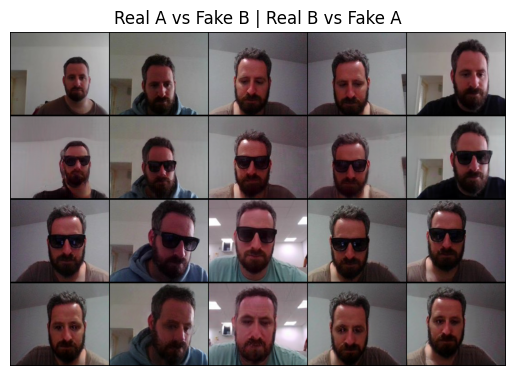

[Epoch 1/20] [Batch 400/1698] [D loss : 0.084154] [G loss : 1.252513 - (adv : 0.798018, cycle : 0.034330, identity : 0.022239)]


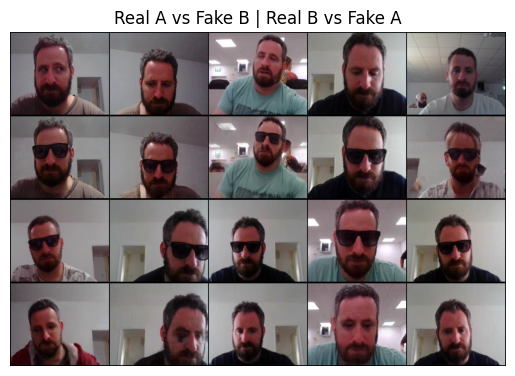

[Epoch 1/20] [Batch 800/1698] [D loss : 0.214911] [G loss : 0.860606 - (adv : 0.494743, cycle : 0.027980, identity : 0.017213)]


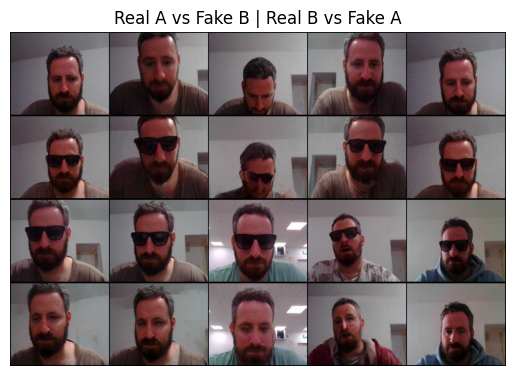

[Epoch 1/20] [Batch 1200/1698] [D loss : 0.126705] [G loss : 1.206655 - (adv : 0.771271, cycle : 0.033207, identity : 0.020662)]
saved model


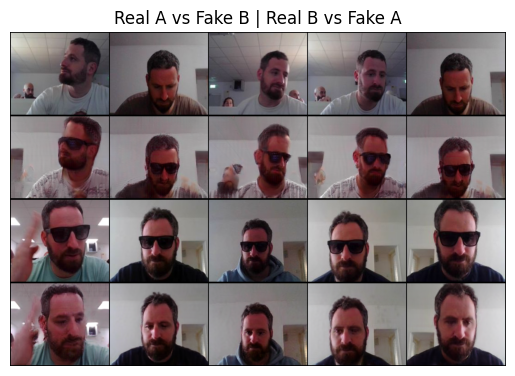

[Epoch 1/20] [Batch 1600/1698] [D loss : 0.205432] [G loss : 0.717464 - (adv : 0.290513, cycle : 0.033002, identity : 0.019386)]


  0%|          | 0/1698 [00:00<?, ?it/s]

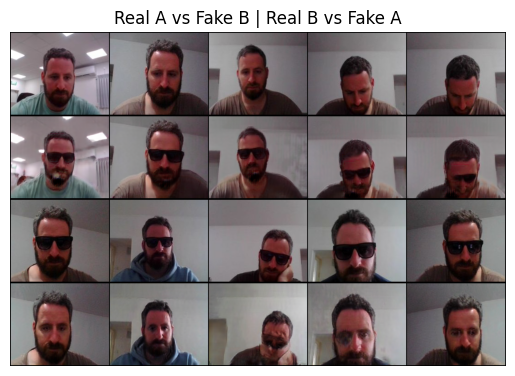

[Epoch 2/20] [Batch 400/1698] [D loss : 0.143778] [G loss : 0.933890 - (adv : 0.540859, cycle : 0.029457, identity : 0.019691)]


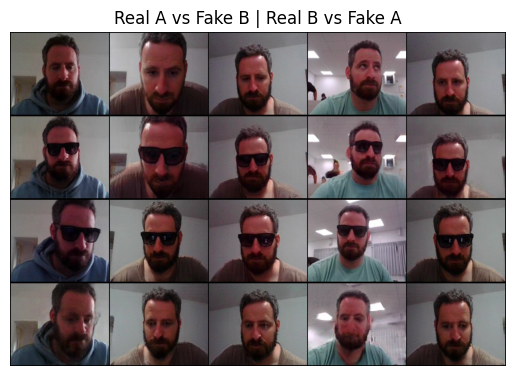

[Epoch 2/20] [Batch 800/1698] [D loss : 0.086451] [G loss : 1.016395 - (adv : 0.612129, cycle : 0.030873, identity : 0.019107)]


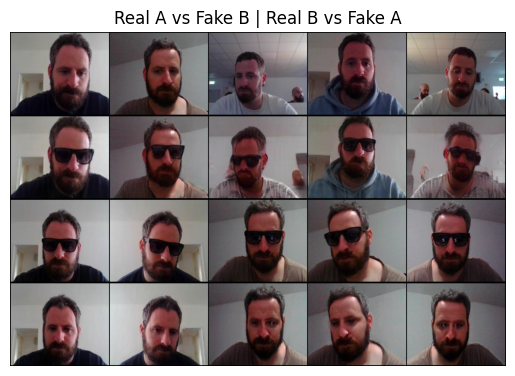

[Epoch 2/20] [Batch 1200/1698] [D loss : 0.111124] [G loss : 0.980190 - (adv : 0.479045, cycle : 0.039647, identity : 0.020934)]


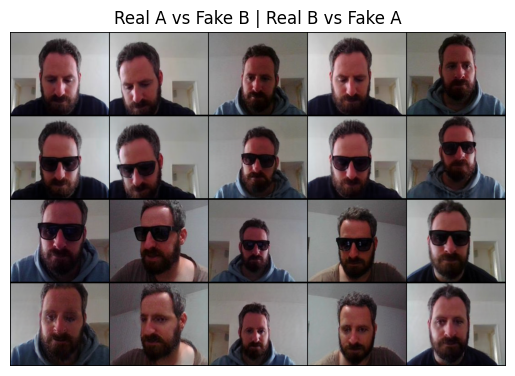

[Epoch 2/20] [Batch 1600/1698] [D loss : 0.083792] [G loss : 0.918073 - (adv : 0.576989, cycle : 0.025584, identity : 0.017048)]


  0%|          | 0/1698 [00:00<?, ?it/s]

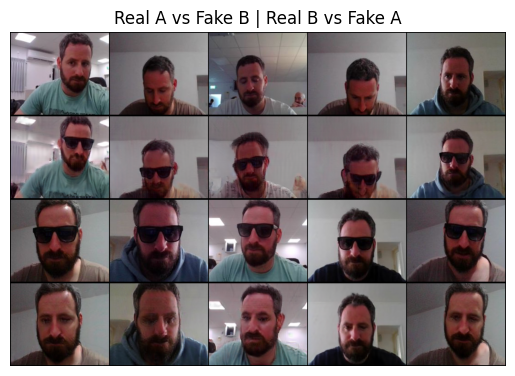

[Epoch 3/20] [Batch 400/1698] [D loss : 0.240453] [G loss : 0.599952 - (adv : 0.246427, cycle : 0.025787, identity : 0.019131)]


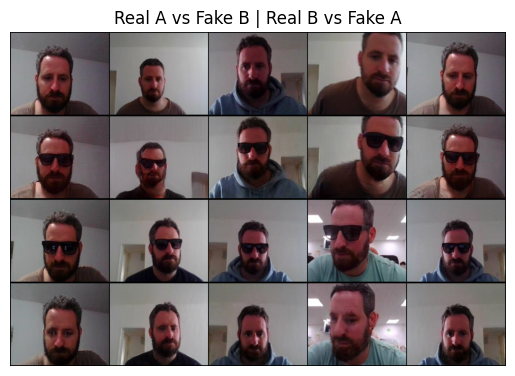

[Epoch 3/20] [Batch 800/1698] [D loss : 0.137273] [G loss : 0.934034 - (adv : 0.511471, cycle : 0.033251, identity : 0.018010)]


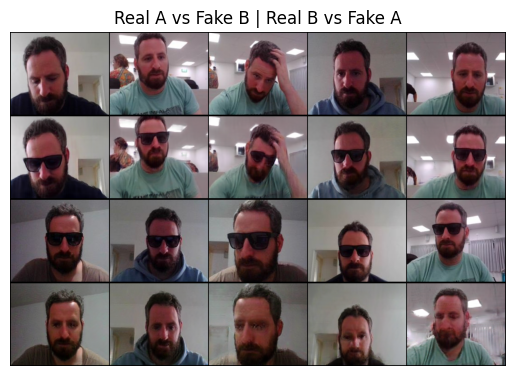

[Epoch 3/20] [Batch 1200/1698] [D loss : 0.126732] [G loss : 1.023279 - (adv : 0.592109, cycle : 0.031469, identity : 0.023296)]


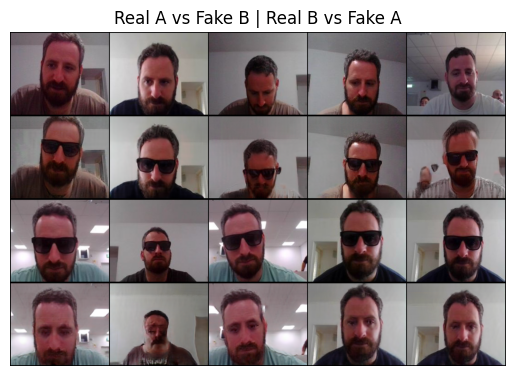

[Epoch 3/20] [Batch 1600/1698] [D loss : 0.224558] [G loss : 1.371000 - (adv : 0.480228, cycle : 0.063231, identity : 0.051693)]


  0%|          | 0/1698 [00:00<?, ?it/s]

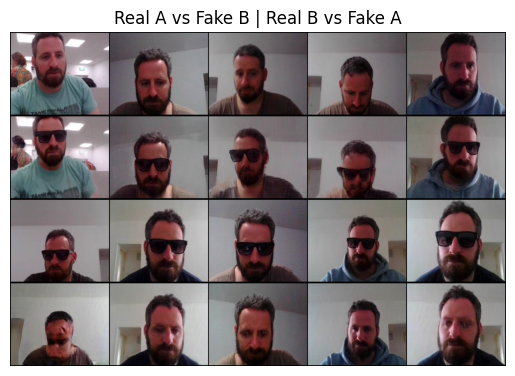

[Epoch 4/20] [Batch 400/1698] [D loss : 0.111717] [G loss : 1.164553 - (adv : 0.814661, cycle : 0.024926, identity : 0.020127)]


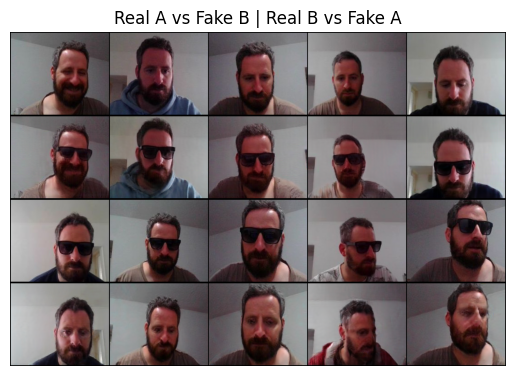

[Epoch 4/20] [Batch 800/1698] [D loss : 0.175157] [G loss : 1.361916 - (adv : 0.822509, cycle : 0.041245, identity : 0.025392)]


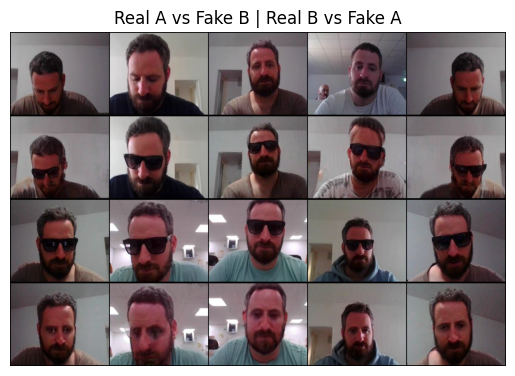

[Epoch 4/20] [Batch 1200/1698] [D loss : 0.261055] [G loss : 0.823307 - (adv : 0.462640, cycle : 0.026475, identity : 0.019184)]


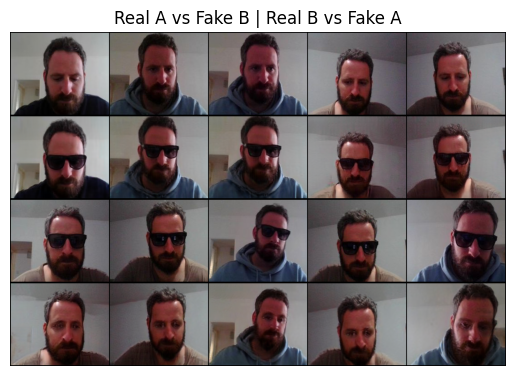

[Epoch 4/20] [Batch 1600/1698] [D loss : 0.238587] [G loss : 1.025186 - (adv : 0.626265, cycle : 0.030632, identity : 0.018521)]


  0%|          | 0/1698 [00:00<?, ?it/s]

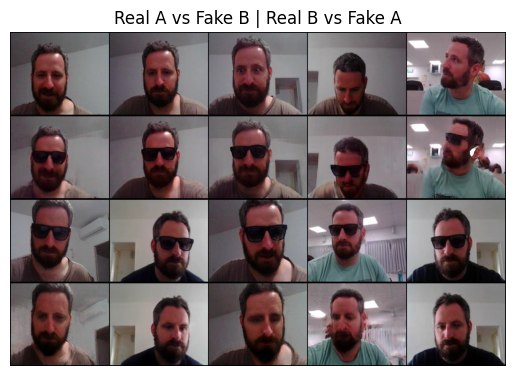

[Epoch 5/20] [Batch 400/1698] [D loss : 0.100561] [G loss : 1.020755 - (adv : 0.609258, cycle : 0.031541, identity : 0.019217)]


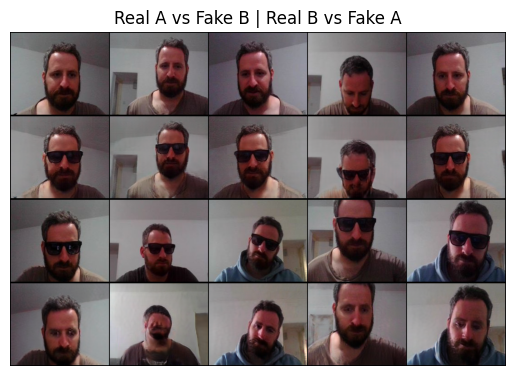

[Epoch 5/20] [Batch 800/1698] [D loss : 0.175233] [G loss : 0.751570 - (adv : 0.378267, cycle : 0.027718, identity : 0.019225)]


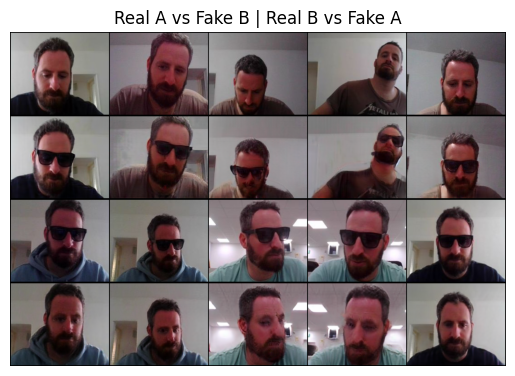

[Epoch 5/20] [Batch 1200/1698] [D loss : 0.212908] [G loss : 1.158502 - (adv : 0.864686, cycle : 0.021773, identity : 0.015217)]


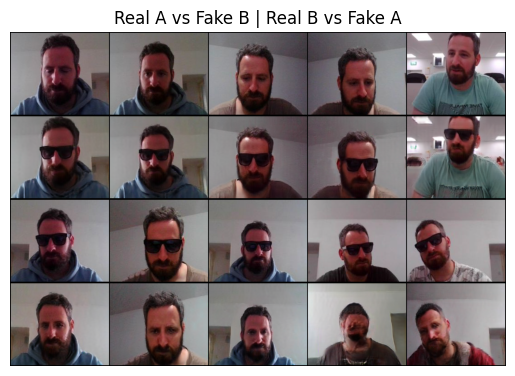

[Epoch 5/20] [Batch 1600/1698] [D loss : 0.212935] [G loss : 0.804739 - (adv : 0.387247, cycle : 0.029644, identity : 0.024211)]


  0%|          | 0/1698 [00:00<?, ?it/s]

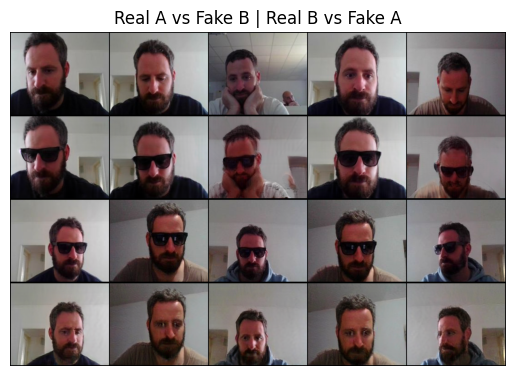

[Epoch 6/20] [Batch 400/1698] [D loss : 0.202301] [G loss : 0.874841 - (adv : 0.405012, cycle : 0.032704, identity : 0.028558)]


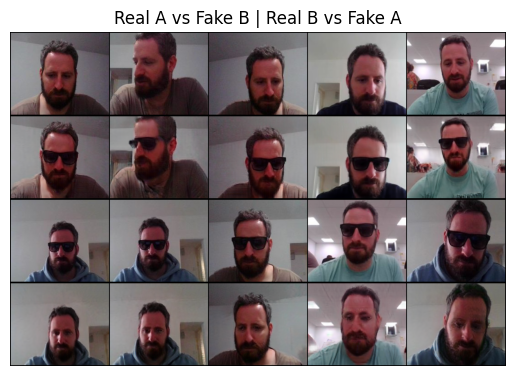

[Epoch 6/20] [Batch 800/1698] [D loss : 0.204586] [G loss : 1.140580 - (adv : 0.569534, cycle : 0.043395, identity : 0.027419)]


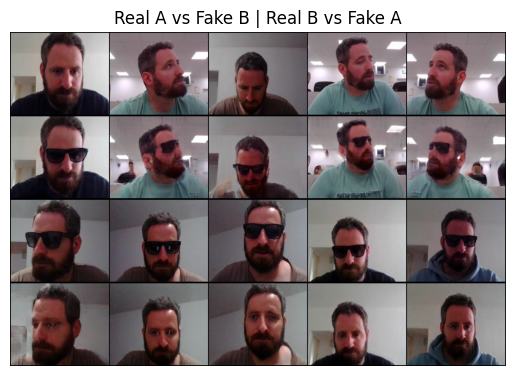

[Epoch 6/20] [Batch 1200/1698] [D loss : 0.133703] [G loss : 0.873341 - (adv : 0.501964, cycle : 0.028109, identity : 0.018058)]


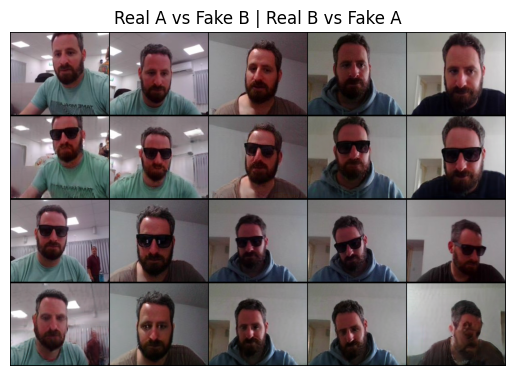

[Epoch 6/20] [Batch 1600/1698] [D loss : 0.112492] [G loss : 0.886732 - (adv : 0.511431, cycle : 0.027663, identity : 0.019735)]


  0%|          | 0/1698 [00:00<?, ?it/s]

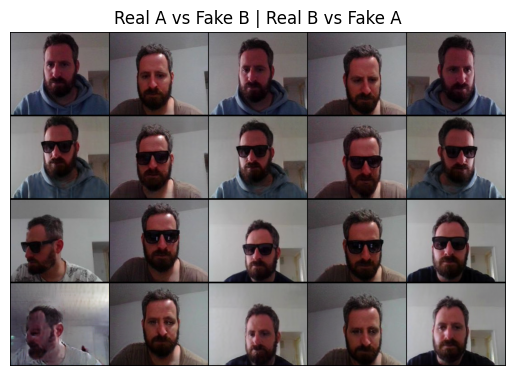

[Epoch 7/20] [Batch 400/1698] [D loss : 0.288067] [G loss : 0.740307 - (adv : 0.344378, cycle : 0.029728, identity : 0.019730)]


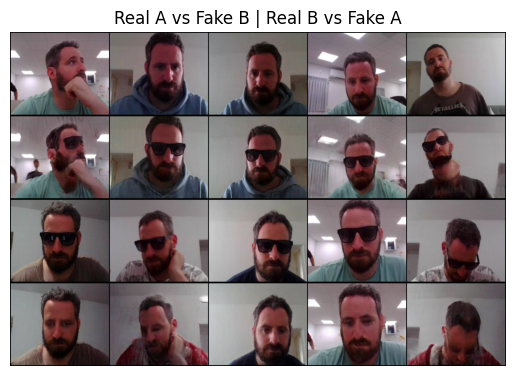

[Epoch 7/20] [Batch 800/1698] [D loss : 0.133281] [G loss : 0.802787 - (adv : 0.421376, cycle : 0.029120, identity : 0.018042)]


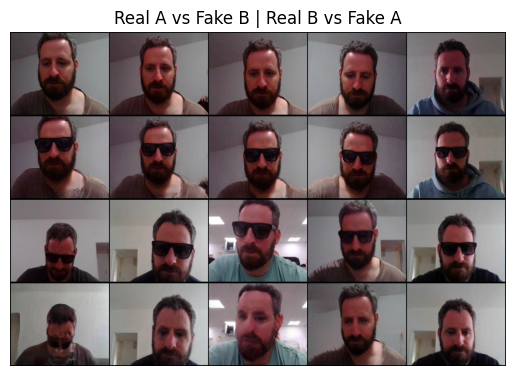

[Epoch 7/20] [Batch 1200/1698] [D loss : 0.127961] [G loss : 1.164778 - (adv : 0.588847, cycle : 0.040585, identity : 0.034016)]


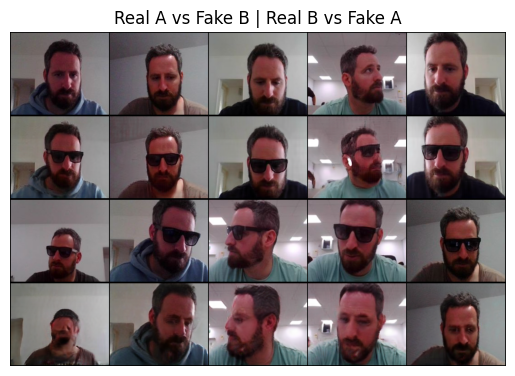

[Epoch 7/20] [Batch 1600/1698] [D loss : 0.178409] [G loss : 1.192703 - (adv : 0.714172, cycle : 0.037127, identity : 0.021452)]


  0%|          | 0/1698 [00:00<?, ?it/s]

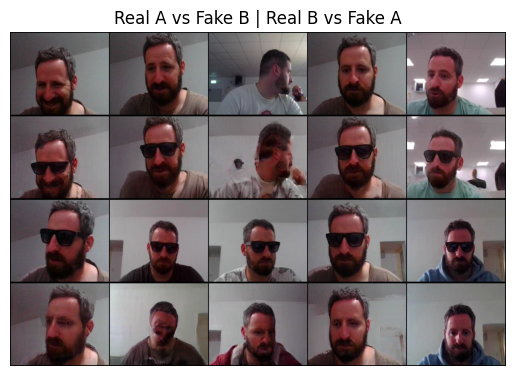

[Epoch 8/20] [Batch 400/1698] [D loss : 0.166082] [G loss : 0.989627 - (adv : 0.592912, cycle : 0.028723, identity : 0.021898)]


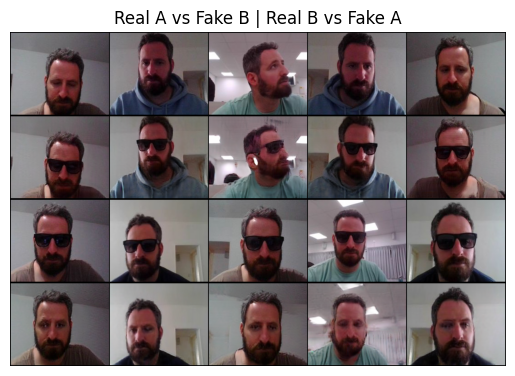

[Epoch 8/20] [Batch 800/1698] [D loss : 0.132004] [G loss : 0.743433 - (adv : 0.362393, cycle : 0.029114, identity : 0.017980)]


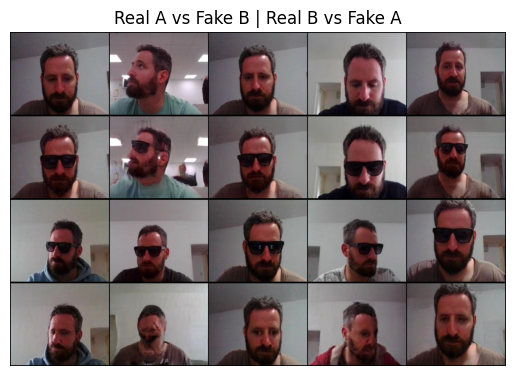

[Epoch 8/20] [Batch 1200/1698] [D loss : 0.097842] [G loss : 1.380365 - (adv : 0.786351, cycle : 0.045697, identity : 0.027409)]


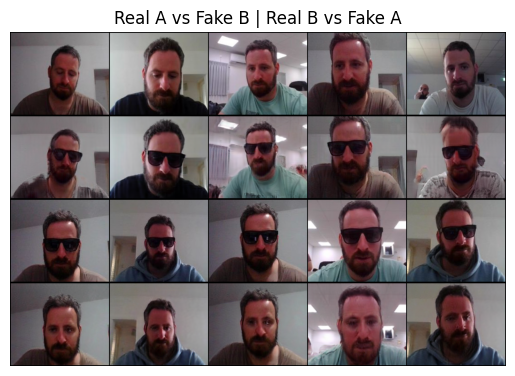

[Epoch 8/20] [Batch 1600/1698] [D loss : 0.180326] [G loss : 0.754485 - (adv : 0.445472, cycle : 0.022223, identity : 0.017357)]


  0%|          | 0/1698 [00:00<?, ?it/s]

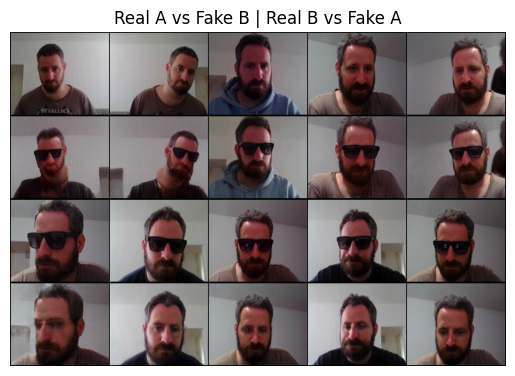

[Epoch 9/20] [Batch 400/1698] [D loss : 0.157799] [G loss : 0.772908 - (adv : 0.407671, cycle : 0.027971, identity : 0.017106)]


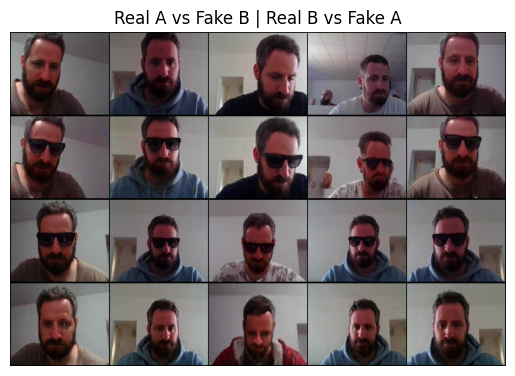

[Epoch 9/20] [Batch 800/1698] [D loss : 0.116241] [G loss : 1.290860 - (adv : 0.825811, cycle : 0.034763, identity : 0.023485)]


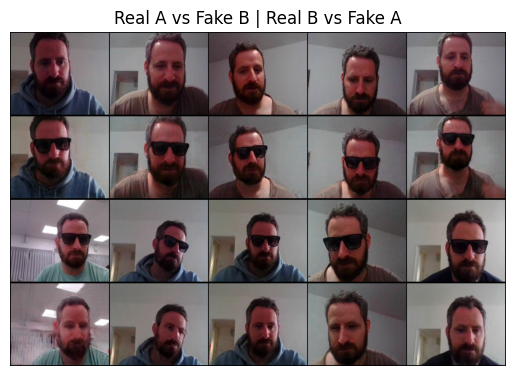

[Epoch 9/20] [Batch 1200/1698] [D loss : 0.164835] [G loss : 0.979024 - (adv : 0.540662, cycle : 0.033317, identity : 0.021039)]


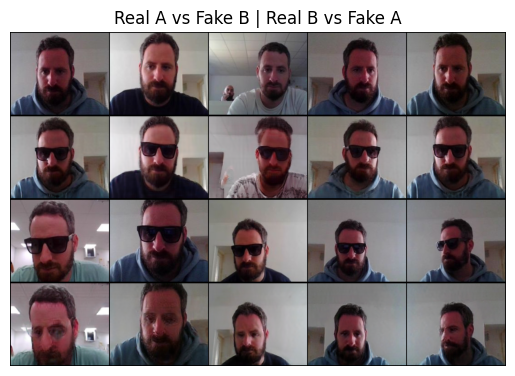

[Epoch 9/20] [Batch 1600/1698] [D loss : 0.295851] [G loss : 0.746290 - (adv : 0.386499, cycle : 0.026343, identity : 0.019271)]


  0%|          | 0/1698 [00:00<?, ?it/s]

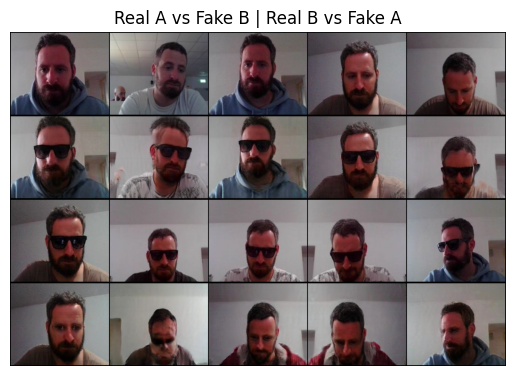

[Epoch 10/20] [Batch 400/1698] [D loss : 0.215497] [G loss : 0.724480 - (adv : 0.388446, cycle : 0.024599, identity : 0.018009)]


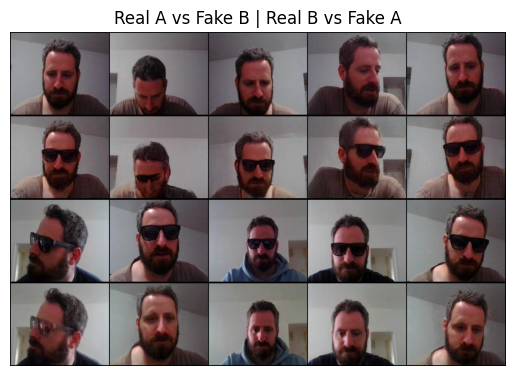

[Epoch 10/20] [Batch 800/1698] [D loss : 0.117718] [G loss : 1.056419 - (adv : 0.534713, cycle : 0.041699, identity : 0.020943)]


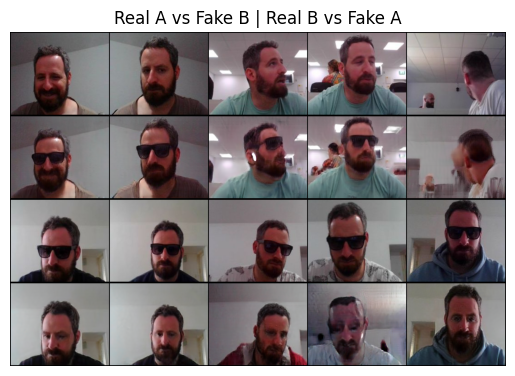

[Epoch 10/20] [Batch 1200/1698] [D loss : 0.149556] [G loss : 1.381632 - (adv : 0.763551, cycle : 0.048578, identity : 0.026460)]


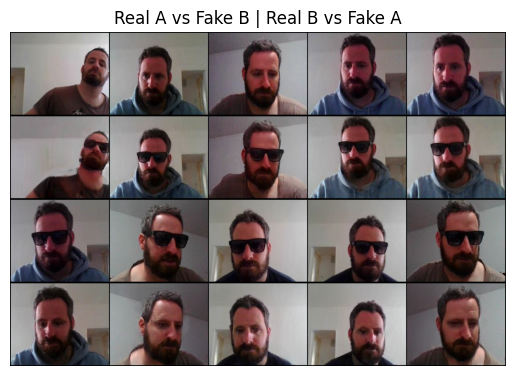

[Epoch 10/20] [Batch 1600/1698] [D loss : 0.138798] [G loss : 0.758554 - (adv : 0.427401, cycle : 0.023883, identity : 0.018464)]


  0%|          | 0/1698 [00:00<?, ?it/s]

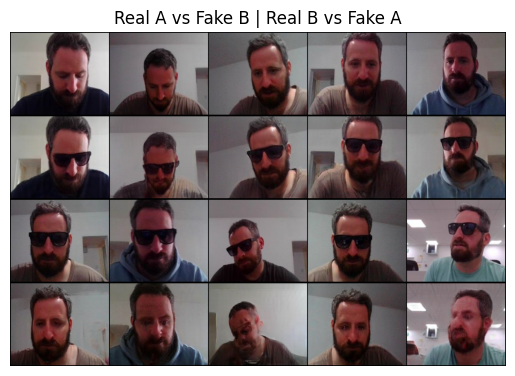

[Epoch 11/20] [Batch 400/1698] [D loss : 0.215649] [G loss : 0.940585 - (adv : 0.574481, cycle : 0.027248, identity : 0.018724)]


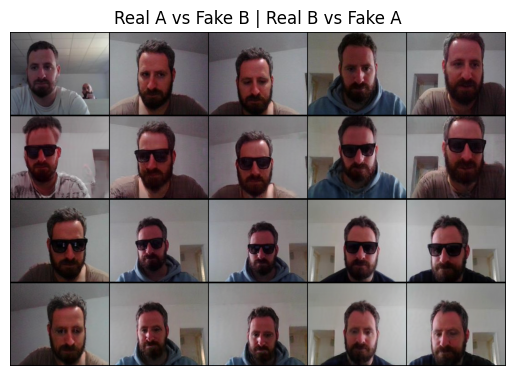

[Epoch 11/20] [Batch 800/1698] [D loss : 0.131303] [G loss : 1.134136 - (adv : 0.683901, cycle : 0.033072, identity : 0.023902)]


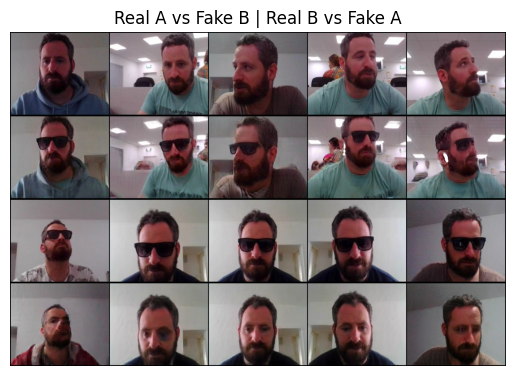

[Epoch 11/20] [Batch 1200/1698] [D loss : 0.171273] [G loss : 0.690879 - (adv : 0.326760, cycle : 0.027604, identity : 0.017615)]


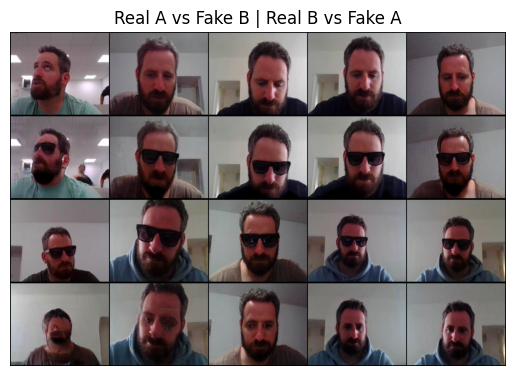

[Epoch 11/20] [Batch 1600/1698] [D loss : 0.172859] [G loss : 1.466508 - (adv : 0.709657, cycle : 0.058741, identity : 0.033889)]


  0%|          | 0/1698 [00:00<?, ?it/s]

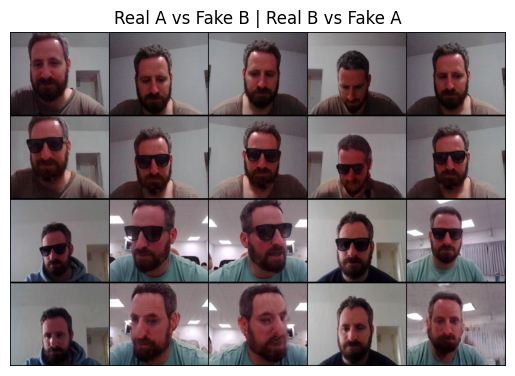

[Epoch 12/20] [Batch 400/1698] [D loss : 0.147360] [G loss : 1.075403 - (adv : 0.651285, cycle : 0.032178, identity : 0.020468)]


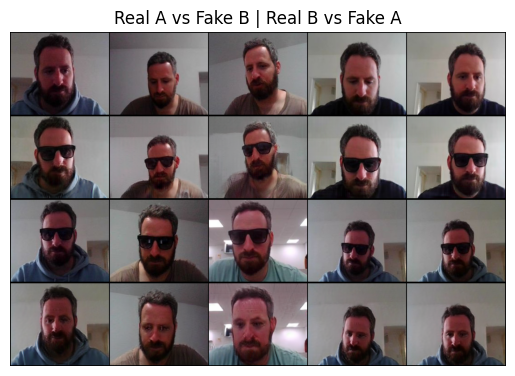

[Epoch 12/20] [Batch 800/1698] [D loss : 0.213183] [G loss : 1.008216 - (adv : 0.409713, cycle : 0.045299, identity : 0.029102)]


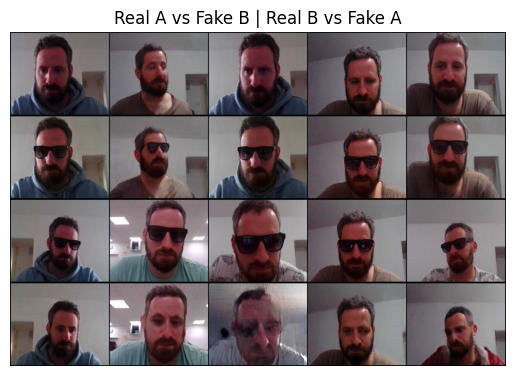

[Epoch 12/20] [Batch 1200/1698] [D loss : 0.173660] [G loss : 1.206665 - (adv : 0.598518, cycle : 0.045115, identity : 0.031400)]


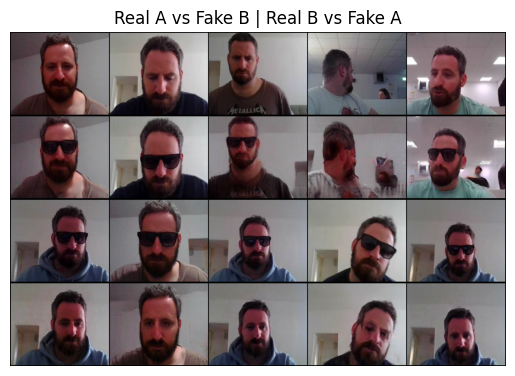

[Epoch 12/20] [Batch 1600/1698] [D loss : 0.157524] [G loss : 0.944405 - (adv : 0.467561, cycle : 0.037476, identity : 0.020416)]


  0%|          | 0/1698 [00:00<?, ?it/s]

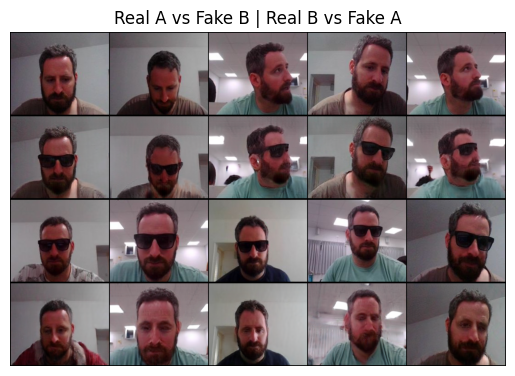

[Epoch 13/20] [Batch 400/1698] [D loss : 0.119509] [G loss : 1.009441 - (adv : 0.639958, cycle : 0.027590, identity : 0.018717)]


In [ ]:
gLossMin = 100
for epoch in range(epoch, n_epochs):
    for i, batch in enumerate(tqdm(dataloader)):
        
        # Set model input
        real_A = batch['A'].type(Tensor)
        real_B = batch['B'].type(Tensor)
        
        # Adversarial ground truths
        valid = Tensor(np.ones((real_A.size(0), *D_A.output_shape))) # requires_grad = False. Default.
        fake = Tensor(np.zeros((real_A.size(0), *D_A.output_shape))) # requires_grad = False. Default.
        
# -----------------
# Train Generators
# -----------------
        G_AB.train() # train mode
        G_BA.train() # train mode
        
        optimizer_G.zero_grad() # Integrated optimizer(G_AB, G_BA)
        
        # Identity Loss
        loss_id_A = criterion_identity(G_BA(real_A), real_A) # If you put A into a generator that creates A with B,
        loss_id_B = criterion_identity(G_AB(real_B), real_B) # then of course A must come out as it is.
                                                             # Taking this into consideration, add an identity loss that simply compares 'A and A' (or 'B and B').
        loss_identity = (loss_id_A + loss_id_B)/2
        
        # GAN Loss
        fake_B = G_AB(real_A) # fake_B is fake-photo that generated by real monet-drawing
        loss_GAN_AB = criterion_GAN(D_B(fake_B), valid) # tricking the 'fake-B' into 'real-B'
        fake_A = G_BA(real_B)
        loss_GAN_BA = criterion_GAN(D_A(fake_A), valid) # tricking the 'fake-A' into 'real-A'
        
        loss_GAN = (loss_GAN_AB + loss_GAN_BA)/2
        
        # Cycle Loss
        recov_A = G_BA(fake_B) # recov_A is fake-monet-drawing that generated by fake-photo
        loss_cycle_A = criterion_cycle(recov_A, real_A) # Reduces the difference between the restored image and the real image
        recov_B = G_AB(fake_A)
        loss_cycle_B = criterion_cycle(recov_B, real_B)
        
        loss_cycle = (loss_cycle_A + loss_cycle_B)/2
        
# ------> Total Loss
        loss_G = loss_GAN + (10.0*loss_cycle) + (5.0*loss_identity) # multiply suggested weight(default cycle loss weight : 10, default identity loss weight : 5)
        
        loss_G.backward()
        optimizer_G.step()
        
# -----------------
# Train Discriminator A
# -----------------
        optimizer_D_A.zero_grad()
    
        loss_real = criterion_GAN(D_A(real_A), valid) # train to discriminate real images as real
        loss_fake = criterion_GAN(D_A(fake_A.detach()), fake) # train to discriminate fake images as fake
        
        loss_D_A = (loss_real + loss_fake)/2
        
        loss_D_A.backward()
        optimizer_D_A.step()

# -----------------
# Train Discriminator B
# -----------------
        optimizer_D_B.zero_grad()
    
        loss_real = criterion_GAN(D_B(real_B), valid) # train to discriminate real images as real
        loss_fake = criterion_GAN(D_B(fake_B.detach()), fake) # train to discriminate fake images as fake
        
        loss_D_B = (loss_real + loss_fake)/2
        
        loss_D_B.backward()
        optimizer_D_B.step()
        
# ------> Total Loss
        loss_D = (loss_D_A + loss_D_B)/2
    
# -----------------
# Show Progress
# -----------------
        if (i+1) % 400 == 0:
            sample_images()
            print('[Epoch %d/%d] [Batch %d/%d] [D loss : %f] [G loss : %f - (adv : %f, cycle : %f, identity : %f)]'
                    %(epoch+1,n_epochs,       # [Epoch -]
                      i+1,len(dataloader),   # [Batch -]
                      loss_D.item(),       # [D loss -]
                      loss_G.item(),       # [G loss -]
                      loss_GAN.item(),     # [adv -]
                      loss_cycle.item(),   # [cycle -]
                      loss_identity.item(),# [identity -]
                     ))
        if(gLossMin > loss_G.item()):
          print("saved model")
          torch.save(G_AB.state_dict(),root+'G_AB1.pth')
          torch.save(G_BA.state_dict(),root+'G_BA1.pth')
          torch.save(D_A.state_dict(),root+'D_A1.pth')
          torch.save(D_B.state_dict(),root+'D_B1.pth')
          gLossMin = loss_G.item()




In [ ]:
epoch = 0

In [ ]:
torch.save(G_AB.state_dict(),root+'G_AB.pth')
torch.save(G_BA.state_dict(),root+'G_BA.pth')
torch.save(D_A.state_dict(),root+'D_A.pth')
torch.save(D_B.state_dict(),root+'D_B.pth')
